# Analisis y clasificación de un ECG

Análisis y clasificación de la base de datos MIT-BIH Arrhythmia Database (mitdb).

In [29]:
#100m 2 360 650000
#100m.mat 16+192 200/mV 11 0 -29 27021 0 MLII
#100m.mat 16+192 200/mV 11 0 -13 3668 0 V5
# 69 M 1085 1629 x1
# Aldomet, Inderal
#Creator: wfdb2mat
#Source: record mitdb/100

import numpy as np
from scipy import signal as sig
import matplotlib.pyplot as plt
import scipy.io as sio
from scipy.interpolate import CubicSpline 


ECG = sio.loadmat('100m.mat')

ecg_ii = ECG['val'][0]
ecg_v5 = ECG['val'][1]
N_ecg_ii = len(ecg_ii)
N_ecg_v5 = len(ecg_v5)

fs = 360 #Hz
f_nyq = fs/2 # 180 Hz

## Densidad espectral de frecuencia

### MLII

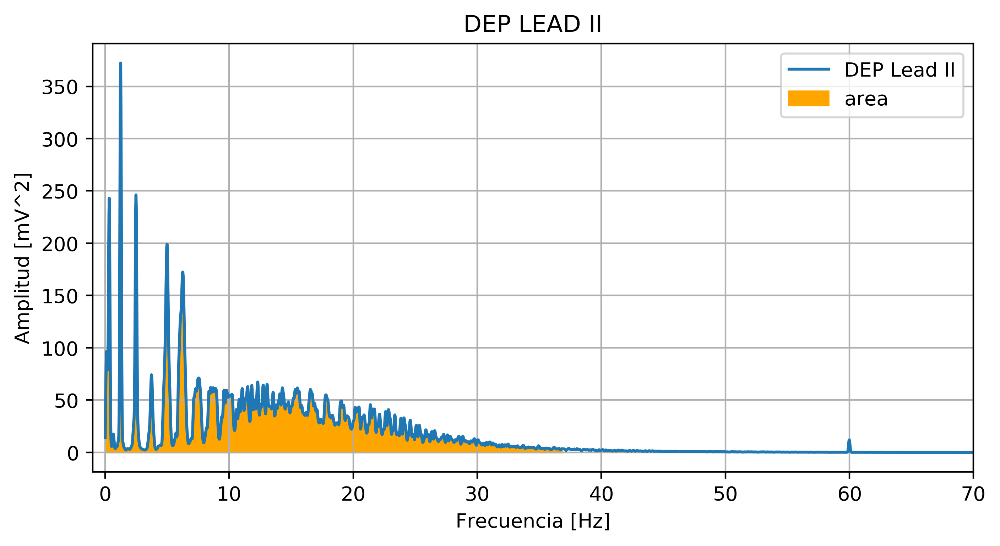

In [2]:
# WELCH MLII

x1_ii = 40000 #muestra
x2_ii = 90000 #muestra

ii_w = ecg_ii[x1_ii:x2_ii]

Fxx_ii,Pxx_ii=sig.welch(ii_w,fs,window='hanning',nperseg=4096,noverlap=4096/2, nfft=4*4096)


plt.figure("Densidad de potencia Lead II",figsize=[8,4],dpi=400)
plt.plot(Fxx_ii,Pxx_ii,label ='DEP Lead II')
plt.title('DEP LEAD II')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud [mV^2]')
plt.grid(which='both', axis='both')
plt.xlim(-1,70,1)

plt.fill_between(Fxx_ii,Pxx_ii,color='orange',where=Fxx_ii>=0.13,label='area')
plt.fill_between(Fxx_ii,Pxx_ii,color='white',where=Fxx_ii>=37)

axes_DEP_II = plt.gca()
axes_DEP_II.legend()

### V5

En esta particularmente, la cantidad de muestras sin mucho ruido en bajas y altas frecuencias era escaso. Por lo que la resolución toma una forma definida pero sirve como patrón para un diseño posterior de un Filtro.

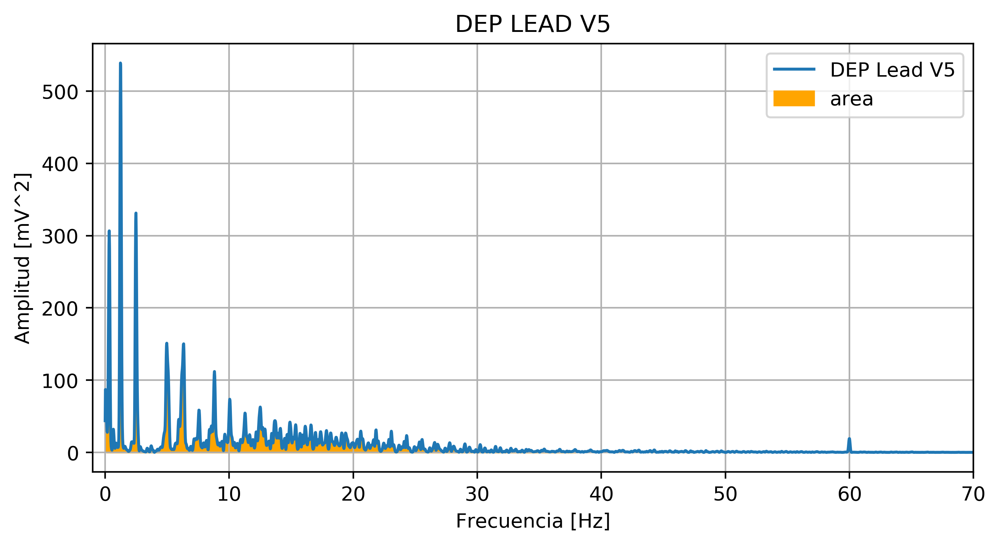

In [3]:
## WELCH LEAD V5

x1_v5 = 3700 #muestra
x2_v5 = 11380 #muestra

v5_w = ecg_v5[x1_v5:x2_v5]

Fxx_v5,Pxx_v5=sig.welch(v5_w,fs,window='hanning',nperseg=4096,noverlap=4096/2, nfft=4*4096)


plt.figure("Densidad de potencia Lead V5",figsize=[8,4],dpi=400)
plt.plot(Fxx_v5,Pxx_v5,label ='DEP Lead V5')
plt.title('DEP LEAD V5')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud [mV^2]')
plt.grid(which='both', axis='both')
plt.xlim(-1,70,1)

plt.fill_between(Fxx_v5,Pxx_v5,color='orange',where=Fxx_v5>=0.13,label='area')
plt.fill_between(Fxx_v5,Pxx_v5,color='white',where=Fxx_v5>=38)

axes_DEP_V5 = plt.gca()
axes_DEP_V5.legend()

# Detecciones del complejo QRS

Para detectar los complejos QRS elegí hacer un filtro pasabanda demasiado restrictivo y así poder localizar rápido los picos pertenecientes a la onda R.

In [4]:
## PLANTILLA IIR

fs0=7
fp0=9
fp1=23
fs1=25

a_max =0.5
at = 40

bp_cheby = sig.iirdesign(wp=np.array([fp0,fp1])/f_nyq, ws=np.array([fs0,fs1])/f_nyq, gpass=a_max, gstop=at, analog=False, ftype='cheby1', output='sos')

In [5]:
ZonasConFiltrado = (
    [41200,43200],
    [545900,547900],
)

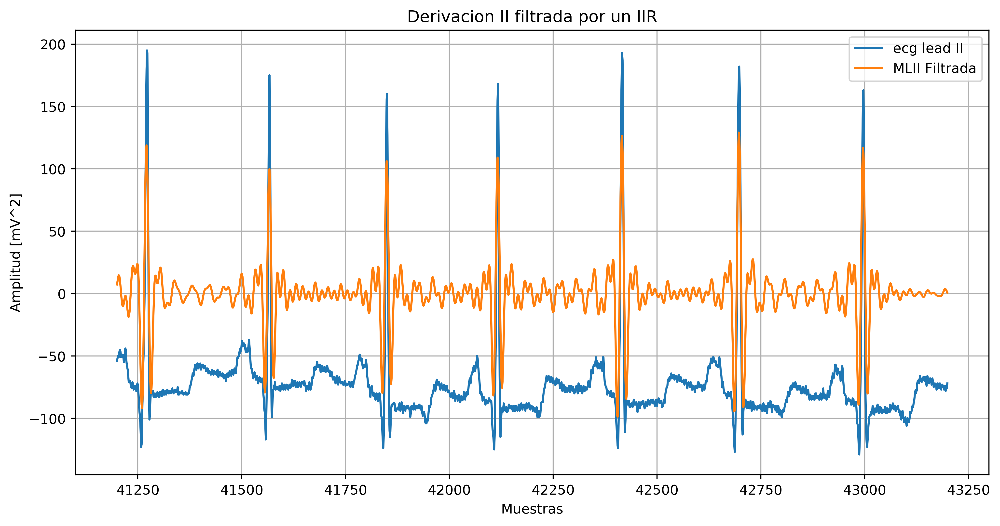

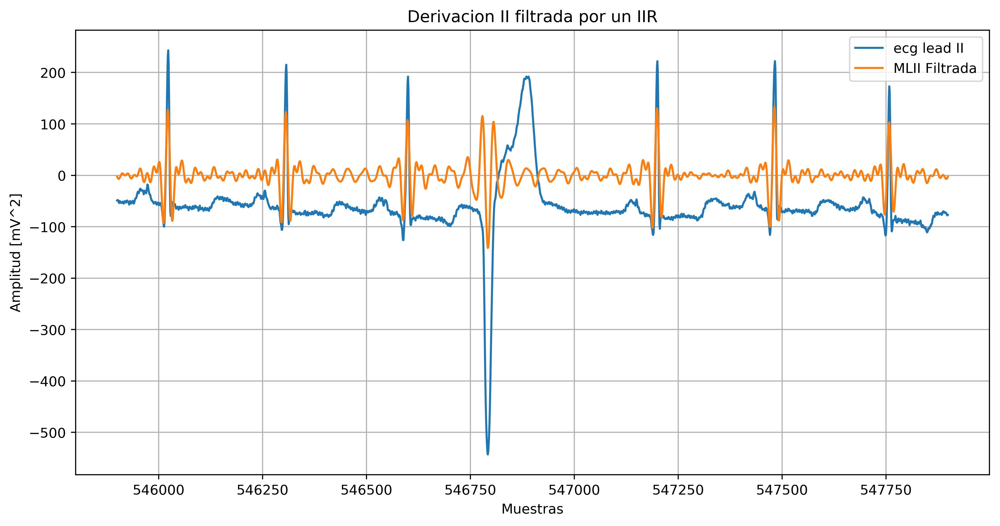

In [6]:
#Filtrado de la derivacion MLII para encontrar los complejos QRS 

ii_filtrada = sig.sosfiltfilt(bp_cheby,ecg_ii)

for i in ZonasConFiltrado:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,ecg_ii[zoom],label='ecg lead II')
    plt.plot(zoom,ii_filtrada[zoom],label='MLII Filtrada')

    plt.title('Derivacion II filtrada por un IIR')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV^2]')
    plt.grid(which='both', axis='both')

    axes_ii_iir = plt.gca()
    axes_ii_iir.legend()


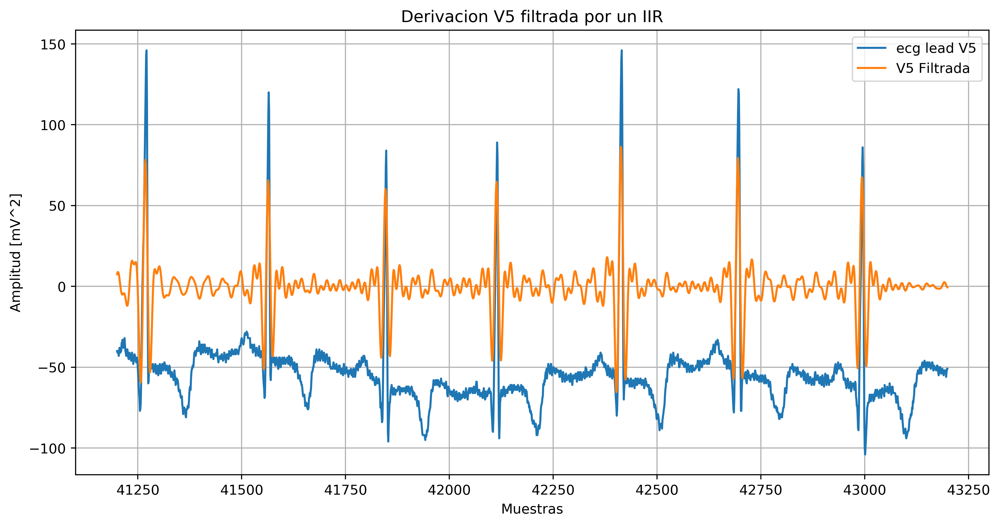

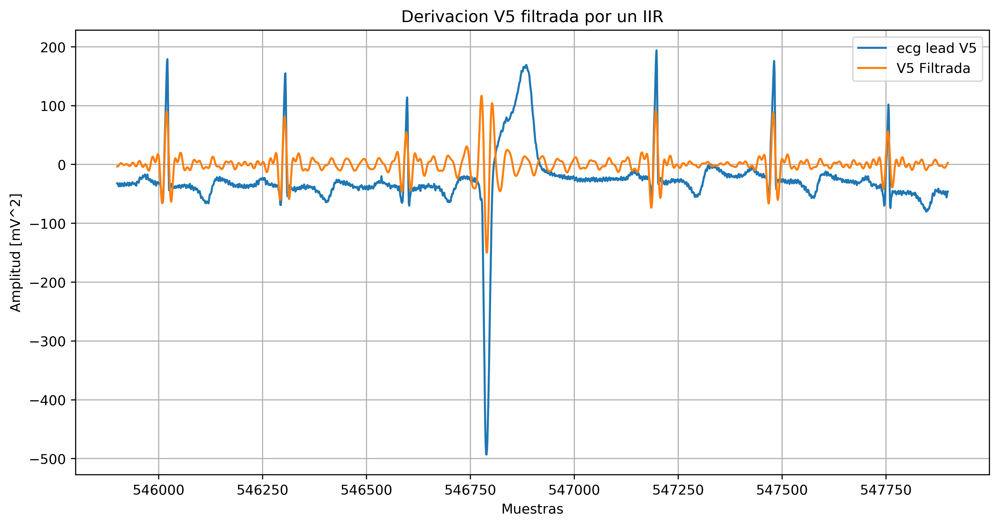

In [7]:
#Filtrado de la derivacion MLII para encontrar los complejos QRS

v5_filtrada = sig.sosfiltfilt(bp_cheby,ecg_v5)

for i in ZonasConFiltrado:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,ecg_v5[zoom],label='ecg lead V5')
    plt.plot(zoom,v5_filtrada[zoom],label='V5 Filtrada')

    plt.title('Derivacion V5 filtrada por un IIR')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV^2]')
    plt.grid(which='both', axis='both')

    axes_v5_iir = plt.gca()
    axes_v5_iir.legend()

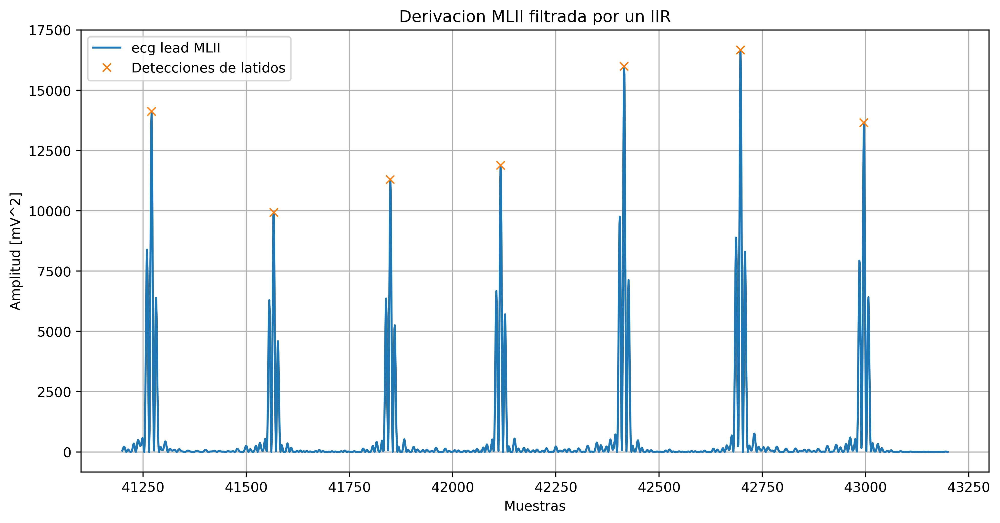

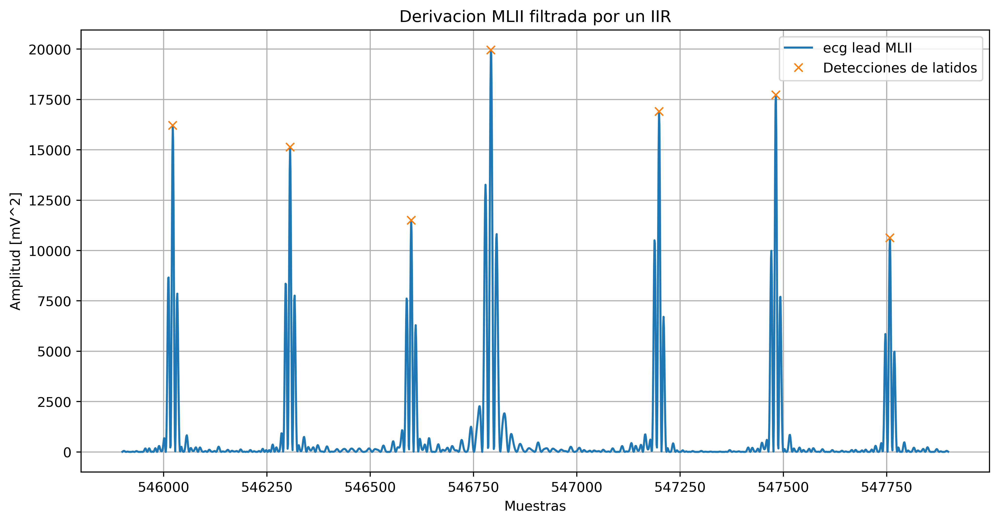

In [8]:
EN_II = pow(ii_filtrada,2)

w=34
qrs_ii=[]

for i in range(0 , (N_ecg_ii-round(w/2))):
    if EN_II[i]>6000 and EN_II[i]==max(EN_II[i-round(w/2):i+round(w/2)]):
        qrs_ii.append(int(np.where(EN_II == EN_II[i])[0]))  


for i in ZonasConFiltrado:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,EN_II[zoom],label='ecg lead MLII')
    
    if i[0]==41200:
        l1,l2 =141,148 # 41200 , 43200
    else:
        l1,l2 =1903,1910 # 545900 , 547900
    plt.plot(qrs_ii[l1:l2],EN_II[qrs_ii[l1:l2]],'x',label='Detecciones de latidos')

    plt.title('Derivacion MLII filtrada por un IIR')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV^2]')
    plt.grid(which='both', axis='both')

    axes_v5_iir = plt.gca()
    axes_v5_iir.legend()

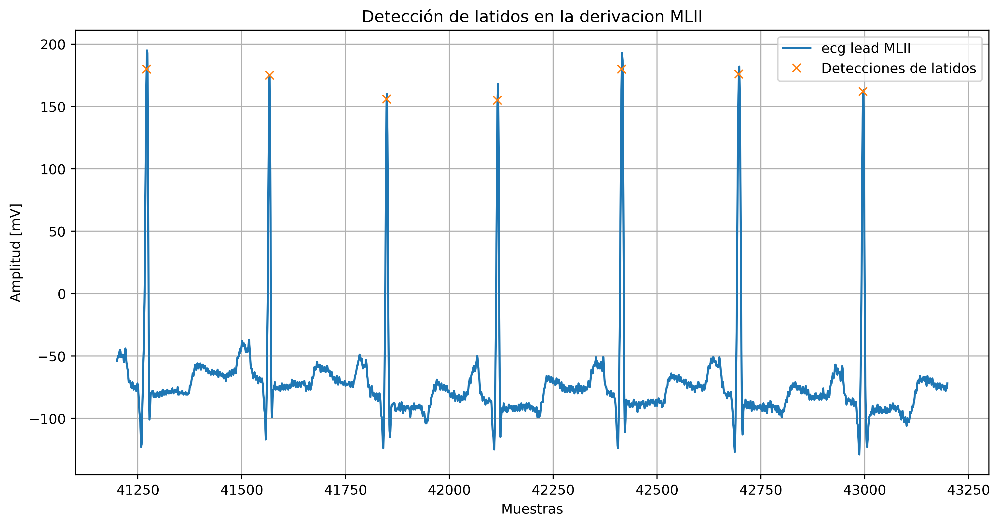

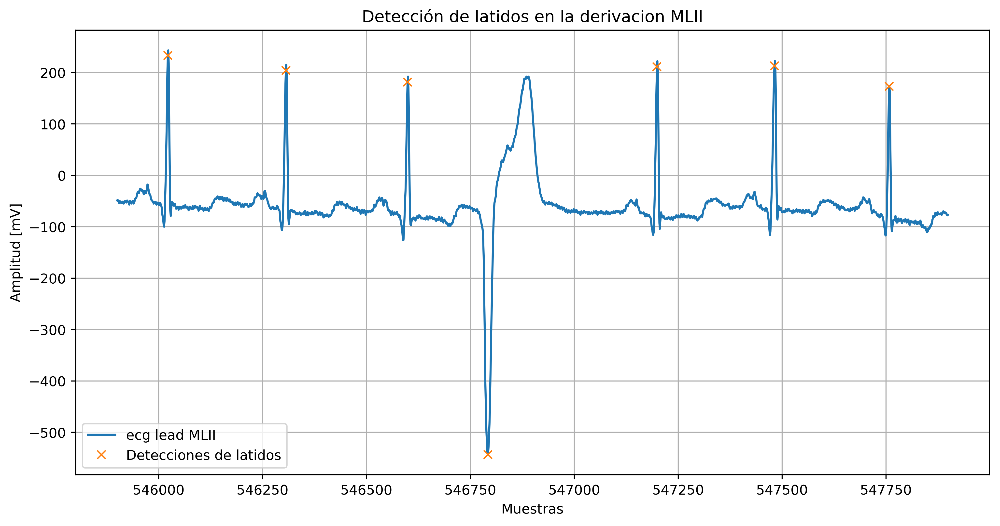

In [9]:
for i in ZonasConFiltrado:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,ecg_ii[zoom],label='ecg lead MLII')
    
    if i[0]==41200:
        l1,l2 =141,148 # 41200 , 43200
    else:
        l1,l2 =1903,1910 # 545900 , 547900
    plt.plot(qrs_ii[l1:l2],ecg_ii[qrs_ii[l1:l2]],'x',label='Detecciones de latidos')

    plt.title('Detección de latidos en la derivacion MLII')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV]')
    plt.grid(which='both', axis='both')

    axes_qrs_det = plt.gca()
    axes_qrs_det.legend()

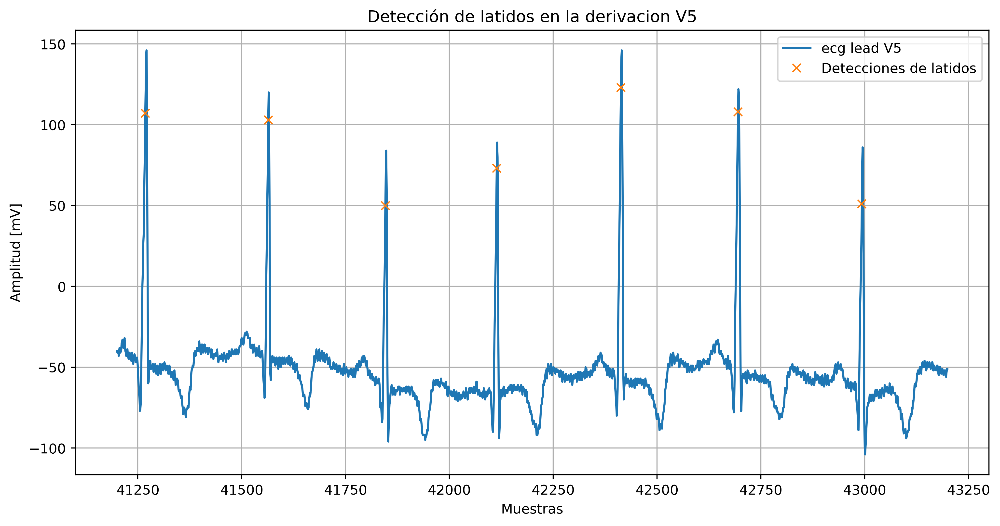

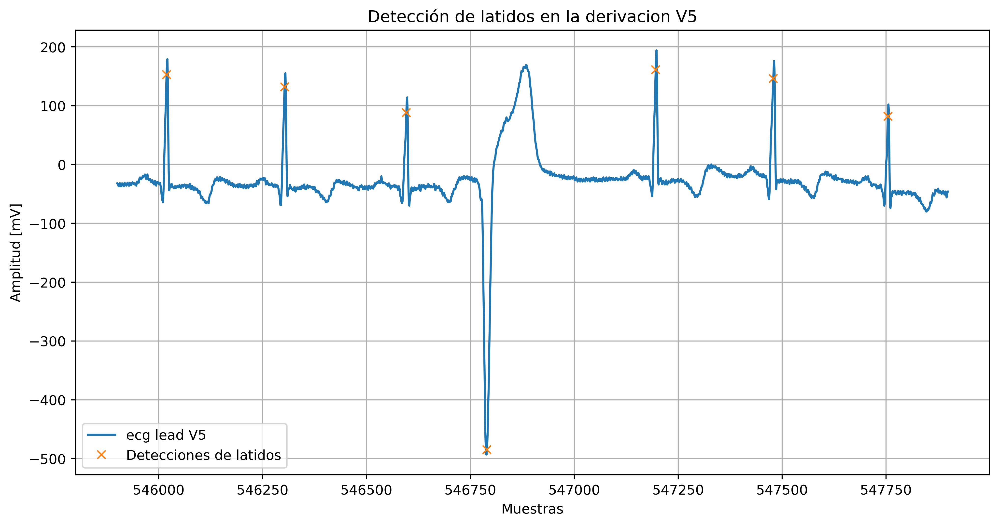

In [10]:
EN_v5 = pow(v5_filtrada,2)

w=34
qrs_v5=[]

for i in range(0 , (N_ecg_v5-round(w/2))):
    if EN_v5[i]>620 and EN_v5[i]==max(EN_v5[i-round(w/2):i+round(w/2)]):
        qrs_v5.append(int(np.where(EN_v5 == EN_v5[i])[0]))
        

for i in ZonasConFiltrado:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,ecg_v5[zoom],label='ecg lead V5')
    
    if i[0]==41200:
        l1,l2 =141,148 # 41200 , 43200
    else:
        l1,l2 =1900,1907 # 545900 , 547900
    plt.plot(qrs_v5[l1:l2],ecg_v5[qrs_v5[l1:l2]],'x',label='Detecciones de latidos')

    plt.title('Detección de latidos en la derivacion V5')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV]')
    plt.grid(which='both', axis='both')

    axes_qrs_det = plt.gca()
    axes_qrs_det.legend()

# Segmentos PQ

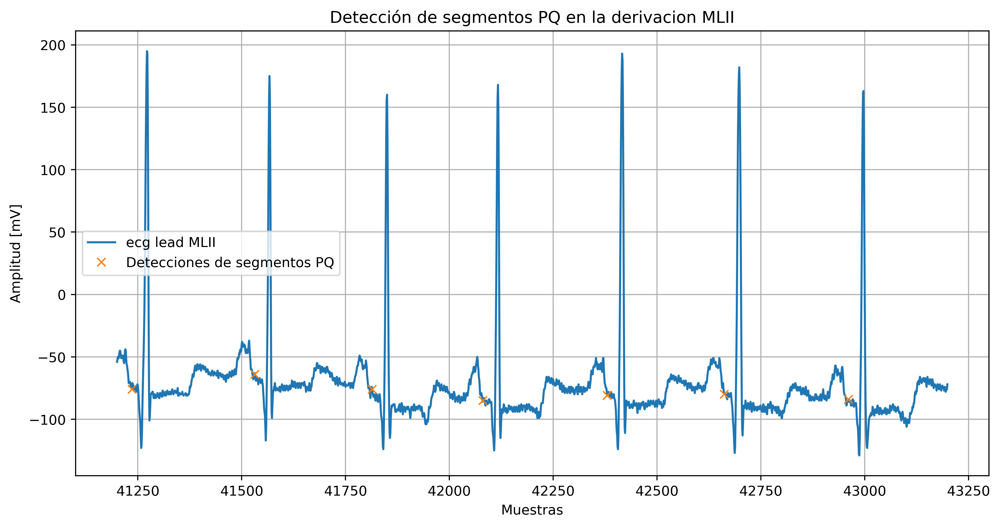

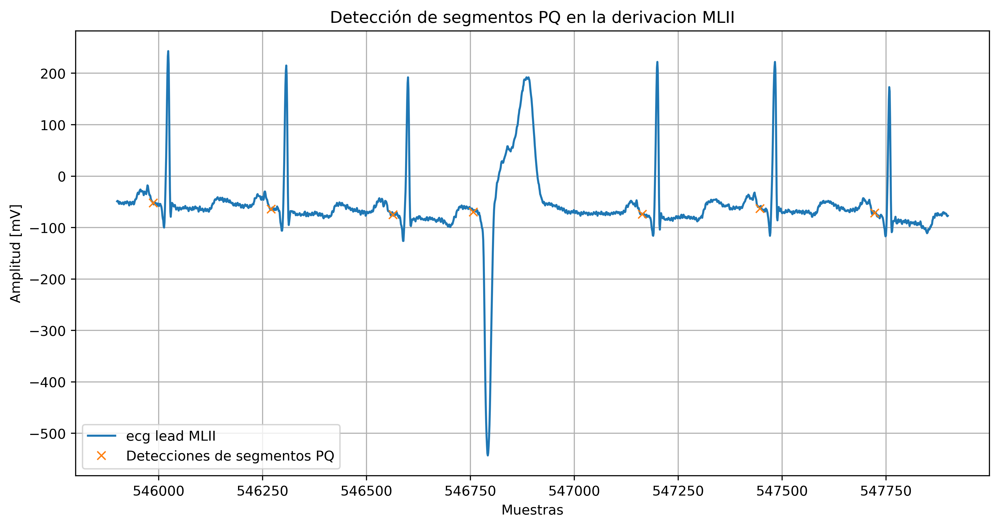

In [11]:
N_QRS_II = len(qrs_ii)

pq_ii=[]
for i in range(0,N_QRS_II-1):
    pq_ii.append(qrs_ii[i]-35)
    

for i in ZonasConFiltrado:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,ecg_ii[zoom],label='ecg lead MLII')
    
    if i[0]==41200:
        l1,l2 =141,148 # 41200 , 43200
    else: 
        l1,l2 =1903,1910 # 545900 , 547900
    plt.plot(pq_ii[l1:l2],ecg_ii[pq_ii[l1:l2]],'x',label='Detecciones de segmentos PQ')

    plt.title('Detección de segmentos PQ en la derivacion MLII')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV]')
    plt.grid(which='both', axis='both')

    axes_qrs_det = plt.gca()
    axes_qrs_det.legend()

In [12]:
N_QRS_V5 = len(qrs_v5)
pq_v5=[]
for i in range(0,N_QRS_V5-1):
    pq_v5.append(qrs_v5[i]-30)
    

# Interpolación mediante Cubic Splane

In [13]:
##PARA LA DERIVACION ML II

x_ii = np.arange(N_QRS_II)
y_ii=ecg_ii[pq_ii]
cs_ii = CubicSpline(pq_ii,y_ii)
xs_ii = np.arange(0,N_ecg_ii,1)

salida_ii = ecg_ii - cs_ii(xs_ii)

## PARA LA DERIVACION V5

x_v5 = np.arange(N_QRS_V5)
y_v5=ecg_v5[pq_v5]
cs_v5 = CubicSpline(pq_v5,y_v5)
xs_v5 = np.arange(0,N_ecg_v5,1)

salida_v5 = ecg_v5 - cs_v5(xs_v5)


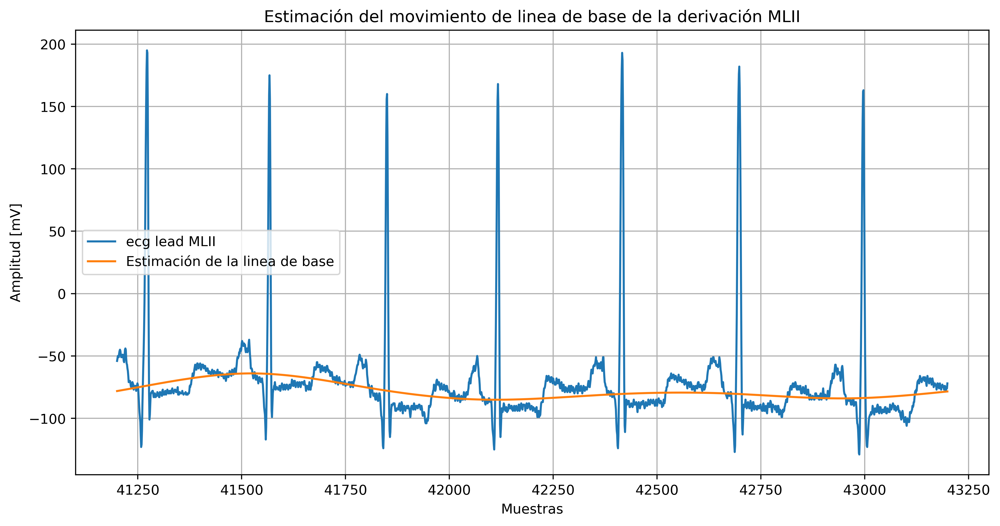

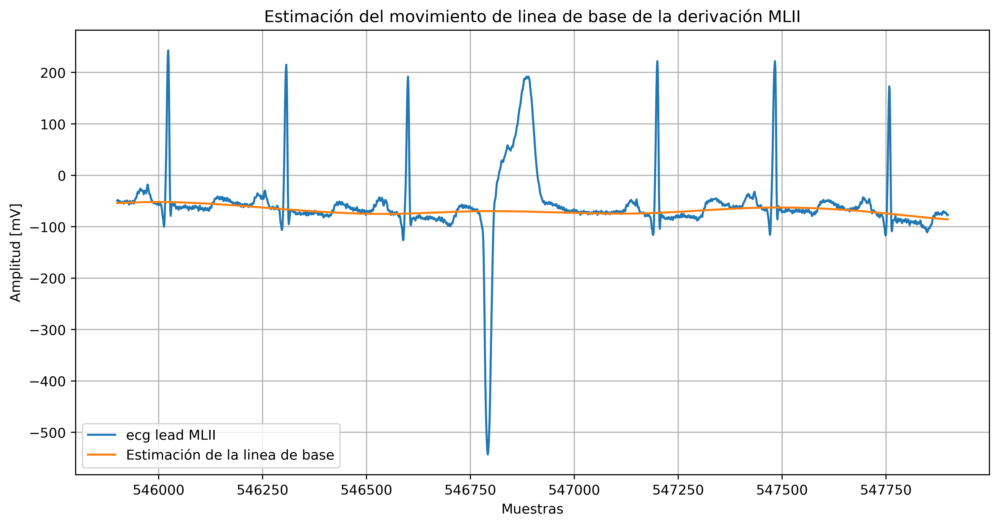

In [14]:
for i in ZonasConFiltrado:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,ecg_ii[zoom],label='ecg lead MLII')
    
    if i[0]==41200:
        l1,l2 = 41200 , 43200
    else: 
        l1,l2 = 545900 , 547900
    plt.plot(xs_ii[l1:l2],cs_ii(xs_ii[l1:l2]),label='Estimación de la linea de base')

    plt.title('Estimación del movimiento de linea de base de la derivación MLII')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV]')
    plt.grid(which='both', axis='both')

    axes_qrs_det = plt.gca()
    axes_qrs_det.legend()


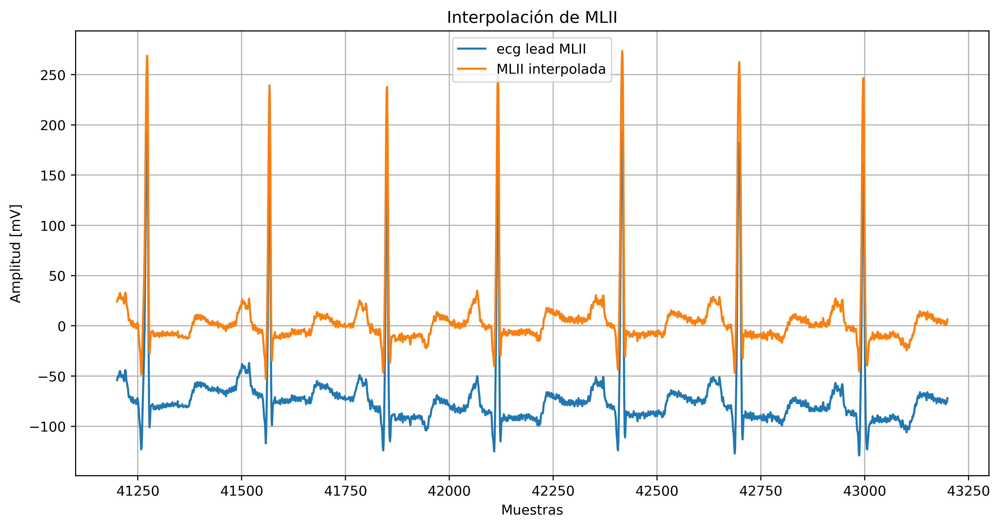

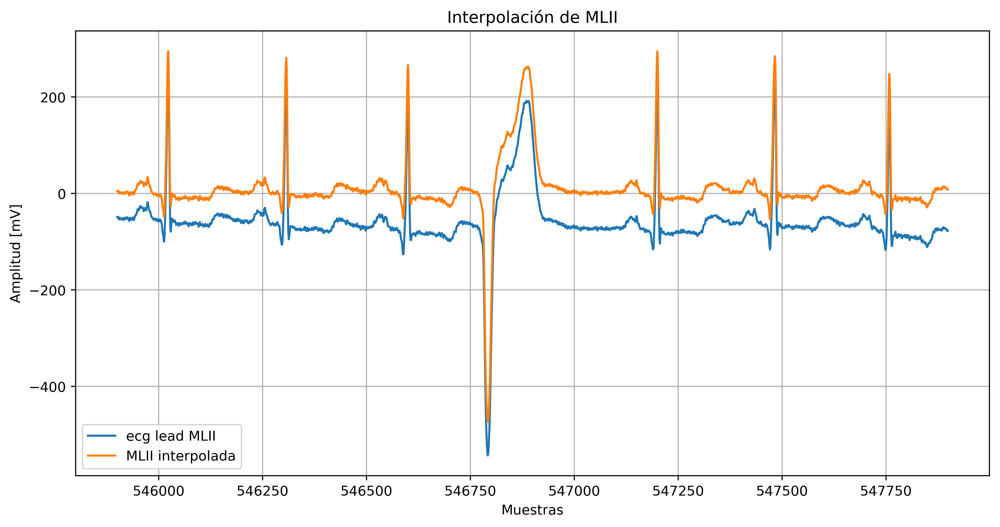

In [15]:
for i in ZonasConFiltrado:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,ecg_ii[zoom],label='ecg lead MLII')
    plt.plot(zoom,salida_ii[zoom],label='MLII interpolada')

    plt.title('Interpolación de MLII')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV]')
    plt.grid(which='both', axis='both')

    axes_qrs_det = plt.gca()
    axes_qrs_det.legend()


# Filtrado de ruido de Alta Frecuencia utilizando un FIR LPF

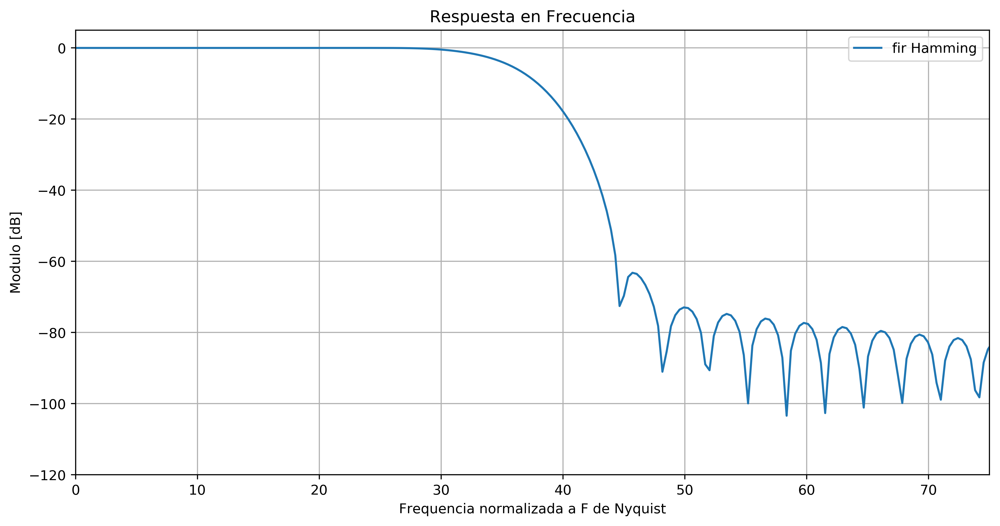

In [16]:
fs = 360 #Hz
f_nyq = fs/2 # 180 Hz

#fc=36 #Hz
freqs= np.array([0 , 30, 35, 40 , f_nyq ])/f_nyq #Hz
gains = np.array([1 , 1,  10**(-3/20) ,0, 0])

N_Hamming=114 #round((8*f_nyq)/(fc1-fc0)) #114
#w_hamming = sig.firwin(N_Hamming , fc/f_nyq , window='hamming',)
w_hamming = sig.firwin2(N_Hamming, freq=freqs, gain=gains,window='hamming',)

## RESP EN MODULO
w,H_Hamming = sig.freqz(w_hamming,[1]) #FIR HAMMING


w=(w/np.pi)*f_nyq #Normalizo a la frecuencia de Nyquist


###### PLOTEOS
plt.figure("Respuesta en frecuencia",figsize=[12,6],dpi=400)

##PLOTEO FIR
plt.plot(w,20*np.log10(np.abs(H_Hamming)), label='fir Hamming')

plt.title('Respuesta en Frecuencia')
plt.xlabel('Frequencia normalizada a F de Nyquist')
plt.ylabel('Modulo [dB]')
plt.grid(which='both', axis='both')
plt.axis([0, 75, -120, 5 ]);

Trazos = plt.gca()
Trazos.legend()

## Filtrado de MLII con un LPF FIR

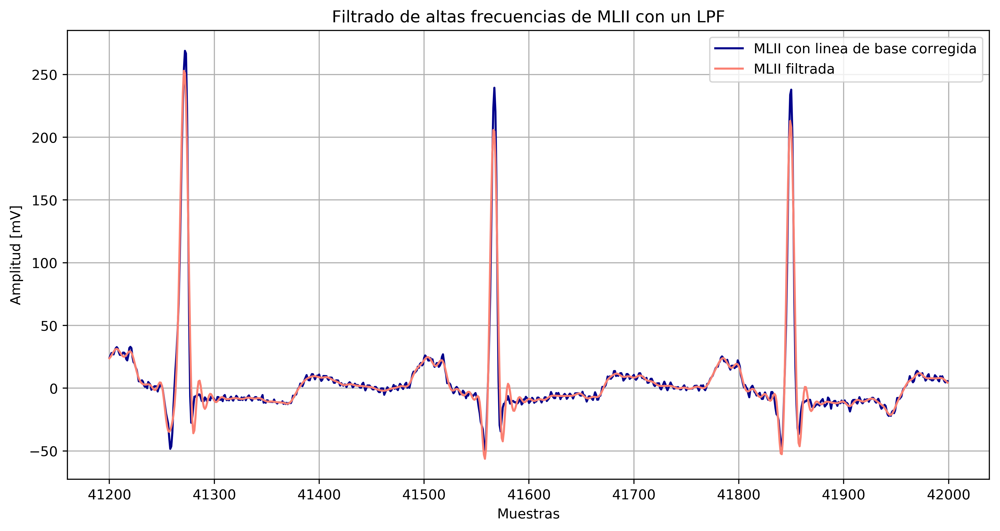

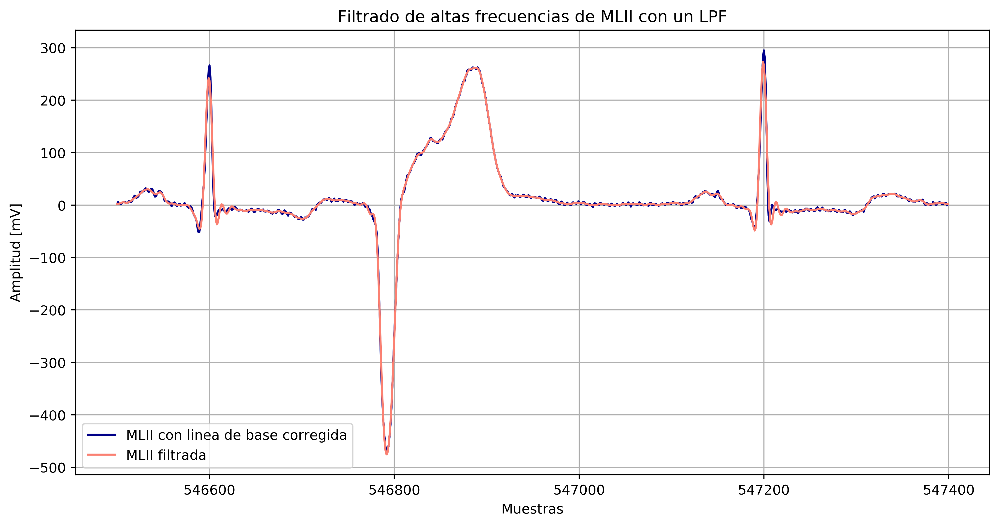

In [17]:
mlii_fir = sig.filtfilt(w_hamming,[1],salida_ii)

ZonasInterpoladas = (
    [41200,42000],
    [546500,547400],
)


for i in ZonasInterpoladas:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,salida_ii[zoom],'darkblue',label='MLII con linea de base corregida')
    plt.plot(zoom,mlii_fir[zoom],'salmon',label='MLII filtrada')

    plt.title('Filtrado de altas frecuencias de MLII con un LPF')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV]')
    plt.grid(which='both', axis='both')

    axes_qrs_det = plt.gca()
    axes_qrs_det.legend()

---

## Filtrado de V5 con un LPF FIR

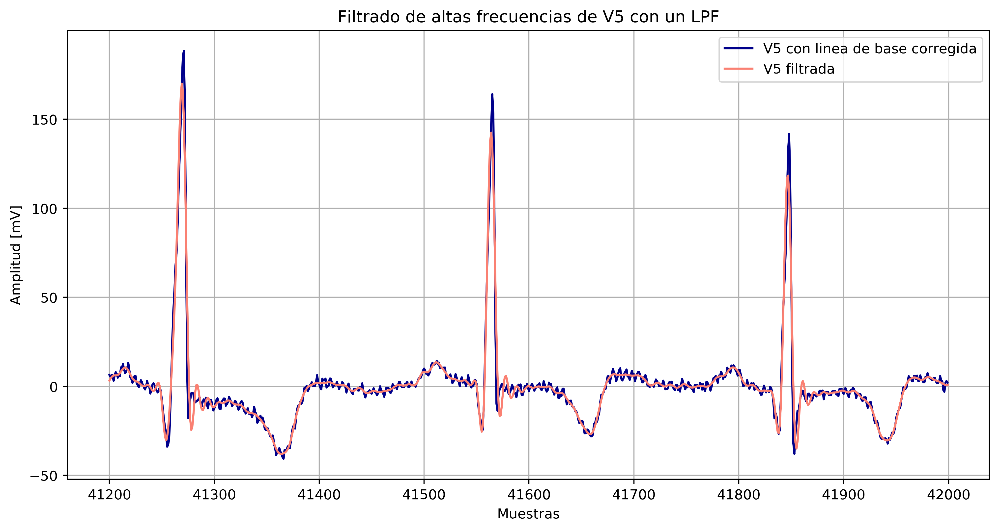

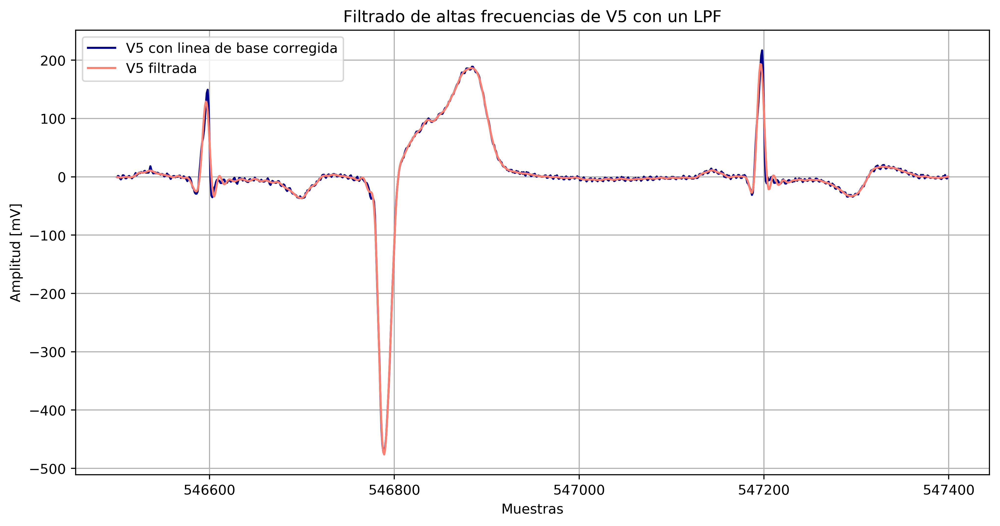

In [18]:
v5_fir = sig.filtfilt(w_hamming,[1],salida_v5)

for i in ZonasInterpoladas:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,salida_v5[zoom],'darkblue',label='V5 con linea de base corregida')
    plt.plot(zoom,v5_fir[zoom],'salmon',label='V5 filtrada')

    plt.title('Filtrado de altas frecuencias de V5 con un LPF')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV]')
    plt.grid(which='both', axis='both')

    axes_qrs_det = plt.gca()
    axes_qrs_det.legend()

## Filtrado de ruido de alta frecuencia utilizando la transformada de Wavelet

## Filtrado de MLII con Wavelet

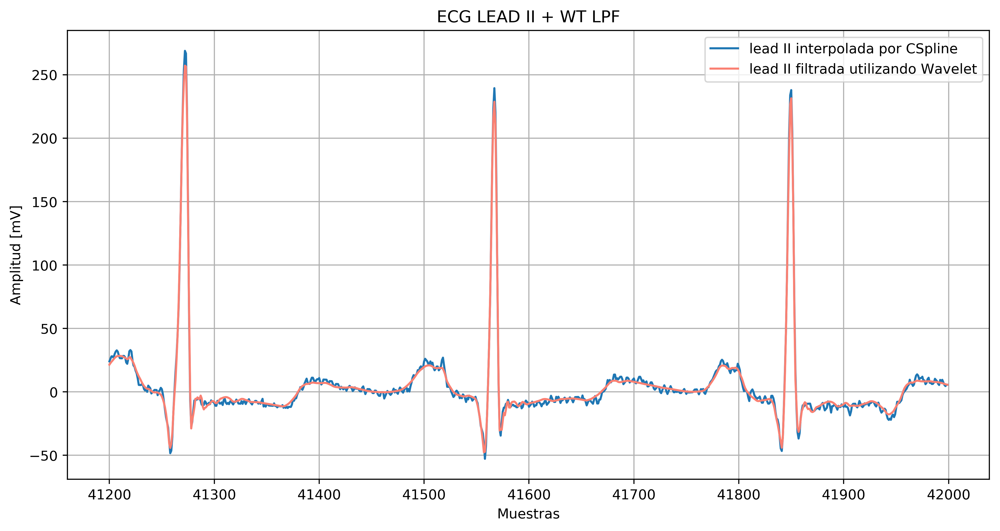

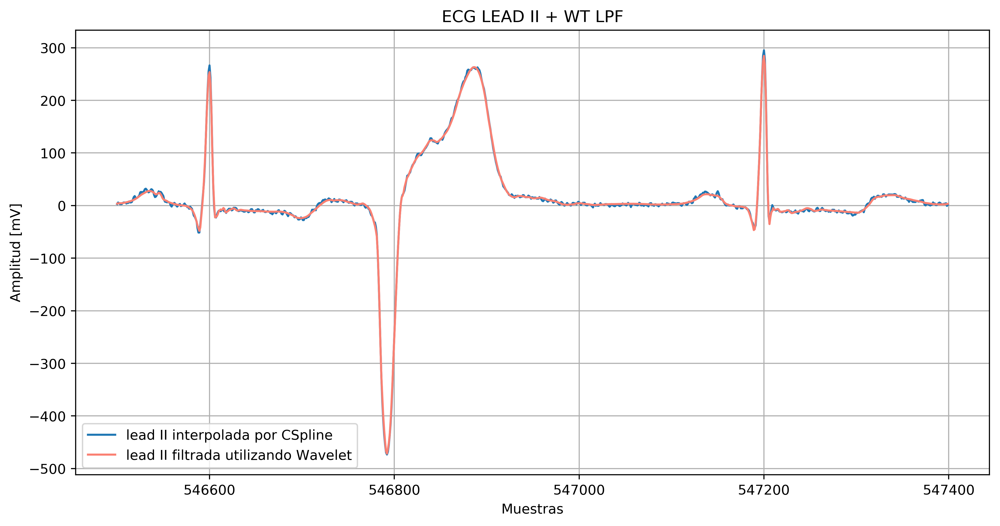

In [19]:
import pywt

wavelet='db4'

coeff = pywt.wavedec(salida_ii,wavelet,level=8)
for i in range(1,len(coeff)):
    coeff[i]=pywt.threshold(coeff[i], value=6,  )


mlii_wt = pywt.waverec(coeff, wavelet , 'smooth')

for i in ZonasInterpoladas:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,salida_ii[zoom],label='lead II interpolada por CSpline')
    plt.plot(zoom,mlii_wt[zoom],'salmon',label='lead II filtrada utilizando Wavelet')

    plt.title('ECG LEAD II + WT LPF')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV]')
    plt.grid(which='both', axis='both')

    axes_WT = plt.gca()
    axes_WT.legend()

## Filtrado de V5 con Wavelet

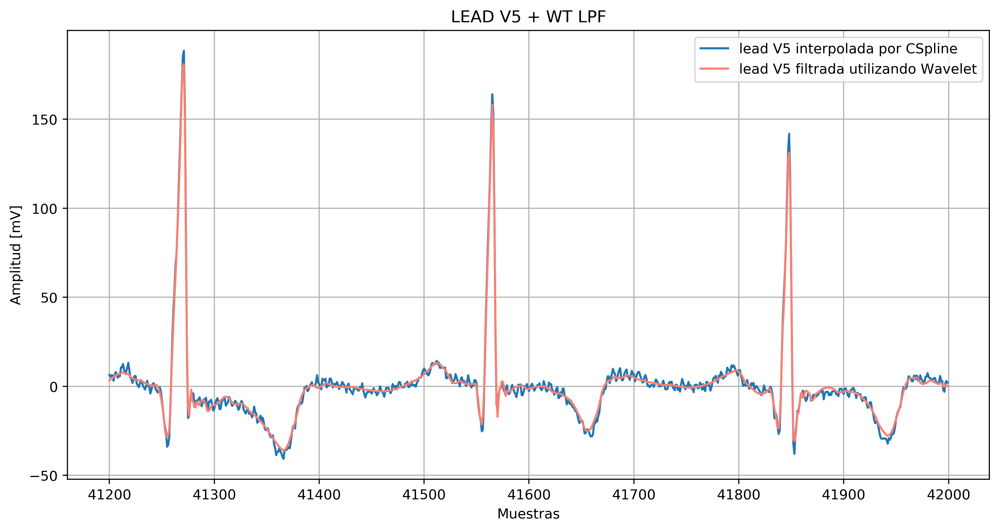

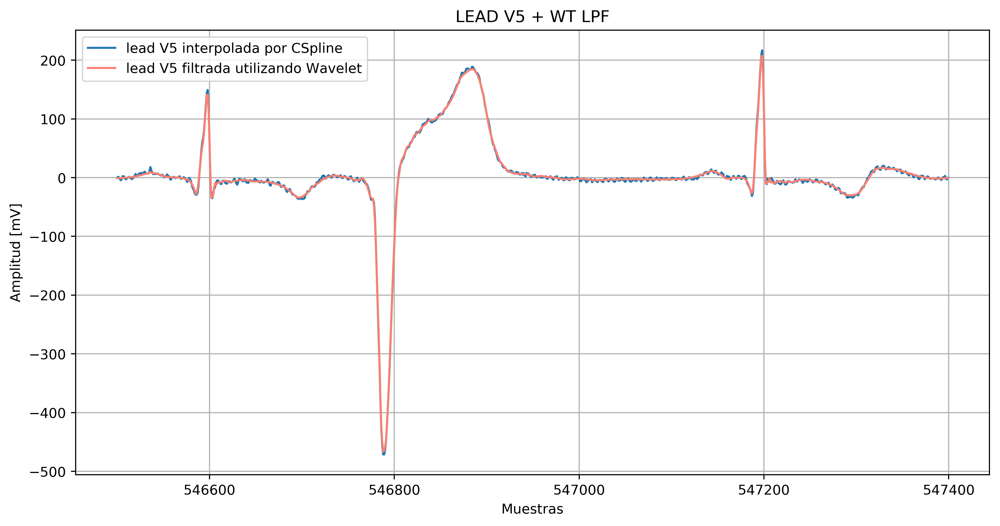

In [20]:
coeff = pywt.wavedec(salida_v5,wavelet,level=8)
for i in range(1,len(coeff)):
    coeff[i]=pywt.threshold(coeff[i], value=5,  )


v5_wt = pywt.waverec(coeff, wavelet , 'smooth')

for i in ZonasInterpoladas:
    zoom = np.arange(i[0],i[1],dtype='int')
    
    plt.figure(figsize=[12,6],dpi=400)
    plt.plot(zoom,salida_v5[zoom],label='lead V5 interpolada por CSpline')
    plt.plot(zoom,v5_wt[zoom],'salmon',label='lead V5 filtrada utilizando Wavelet')

    plt.title('LEAD V5 + WT LPF')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud [mV]')
    plt.grid(which='both', axis='both')

    axes_WT = plt.gca()
    axes_WT.legend()

# Promedio de latidos

## Agrupación

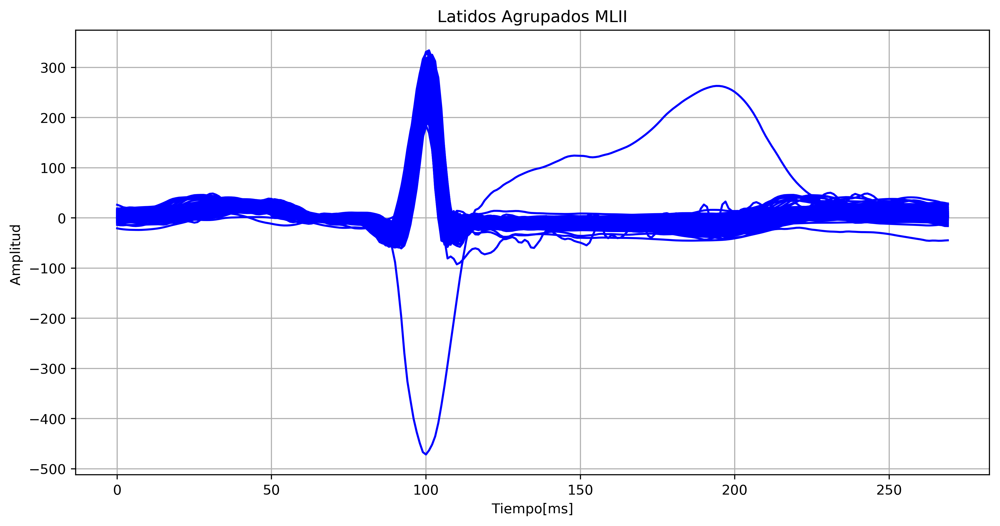

In [21]:
latidos_ii=[None]*(N_QRS_II-1)
for i in range(N_QRS_II-1):
    latidos_ii[i]=[None]*270

for j in range(1,N_QRS_II):
    latidos_ii[j-1]=mlii_wt[(qrs_ii[j]-100):(qrs_ii[j]+170)]

plt.figure("Latidos Agrupados MLII",figsize=[12,6],dpi=400)
for i in range(1,len(latidos_ii)):
    plt.plot(latidos_ii[i],'blue')
plt.title('Latidos Agrupados MLII')
plt.xlabel('Tiempo[ms]')
plt.ylabel('Amplitud ')
plt.grid(which='both', axis='both')


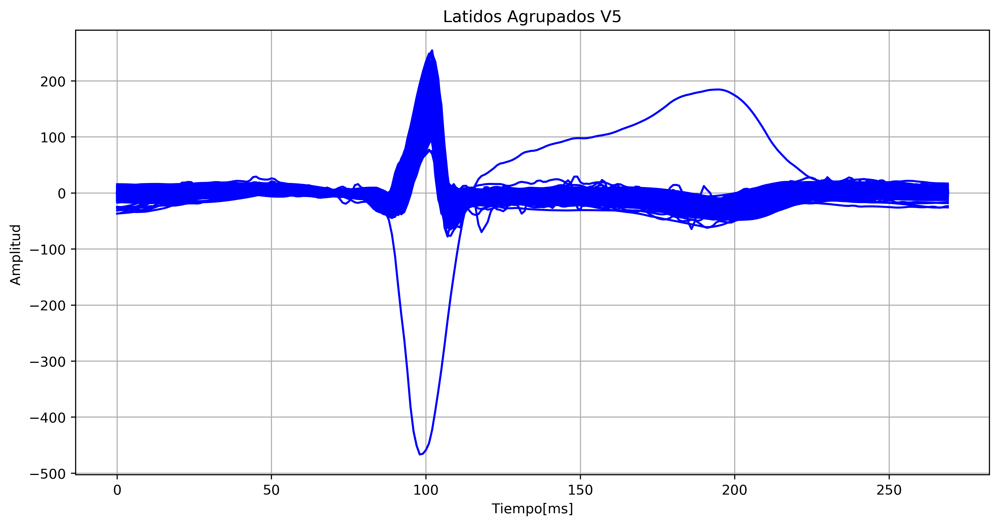

In [22]:
latidos_v5=[None]*(N_QRS_V5-1)
for i in range(N_QRS_V5-1):
    latidos_v5[i]=[None]*270

for j in range(1,N_QRS_V5):
    latidos_v5[j-1]=v5_wt[(qrs_v5[j]-100):(qrs_v5[j]+170)]

plt.figure("Latidos Agrupados V5",figsize=[12,6],dpi=400)
for i in range(1,len(latidos_v5)-1):
    plt.plot(latidos_v5[i],'blue')
plt.title('Latidos Agrupados V5')
plt.xlabel('Tiempo[ms]')
plt.ylabel('Amplitud ')
plt.grid(which='both', axis='both')


## Promedio de latidos

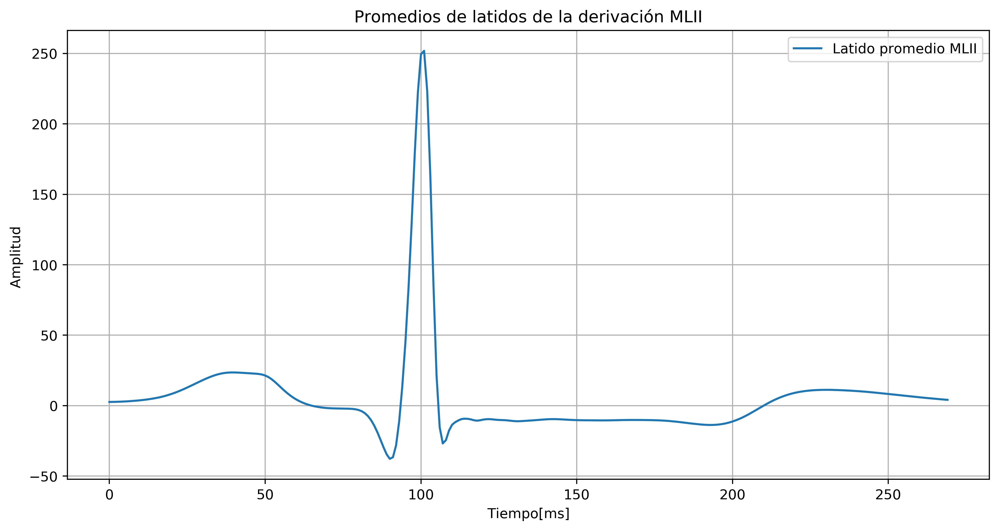

In [23]:
## PROMEDIO DE LATIDOS
latidos_prom_ii=[0]*270
for i in range (0,len(latidos_ii)):
    latidos_prom_ii=latidos_prom_ii+latidos_ii[i]

latidos_prom_ii=latidos_prom_ii/len(latidos_ii)

plt.figure("Latido Promedio MLII",figsize=[12,6],dpi=400)
plt.plot(latidos_prom_ii,label='Latido promedio MLII')
plt.title('Promedios de latidos de la derivación MLII')
plt.xlabel('Tiempo[ms]')
plt.ylabel('Amplitud ')
plt.grid(which='both', axis='both')

axes_LAT_PROM_II = plt.gca()
axes_LAT_PROM_II.legend()

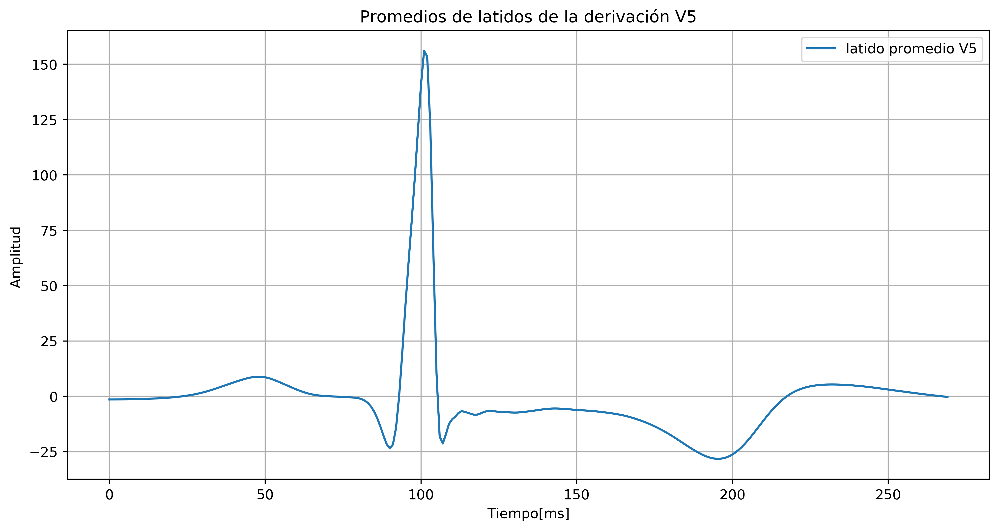

In [24]:
latidos_prom_v5=[0]*270
for i in range (0,len(latidos_v5)-1):
    latidos_prom_v5=latidos_prom_v5+latidos_v5[i]

latidos_prom_v5=latidos_prom_v5/len(latidos_v5)

plt.figure("Latido Promedio V5",figsize=[12,6],dpi=400)
plt.plot(latidos_prom_v5,label='latido promedio V5')
plt.title('Promedios de latidos de la derivación V5')
plt.xlabel('Tiempo[ms]')
plt.ylabel('Amplitud ')
plt.grid(which='both', axis='both')

axes_LAT_PROM_V5 = plt.gca()
axes_LAT_PROM_V5.legend()

# Clasificación

## Parámetros R y T

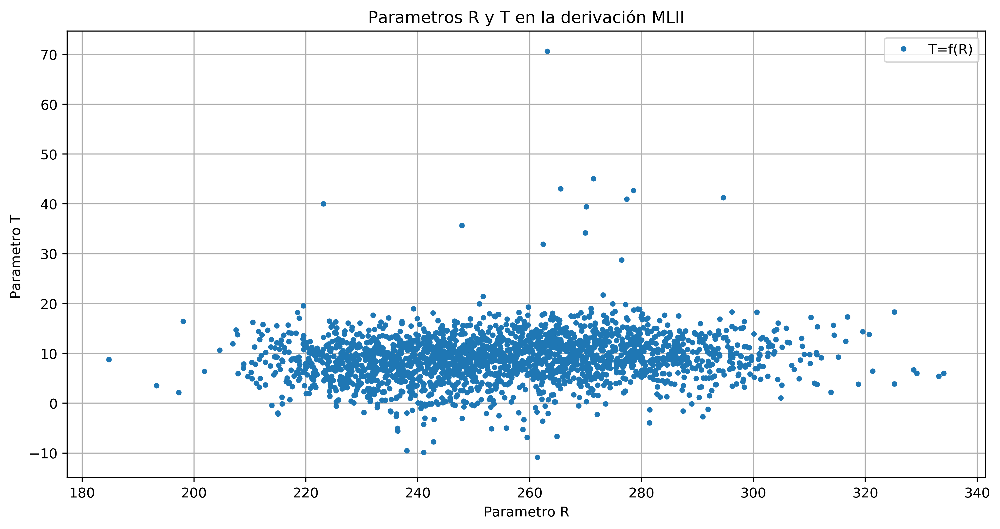

In [25]:
### PARAMETROS R Y T
N_QRS_II = len(qrs_ii)-2

param_R_ii = []
param_T_ii = []
#param_W_ii = []

for i in range(0,N_QRS_II-1):
    param_R_ii.append(max(latidos_ii[i]))
    param_T_ii.append(latidos_ii[i][220] )
    
matrix_lat_ii =[range(2) for i in range(N_QRS_II)]

for i in range(N_QRS_II-1):
    matrix_lat_ii[i] = param_R_ii[i],param_T_ii[i]


plt.figure("parametros RTW MLII",figsize=[12,6],dpi=400)
plt.plot(param_R_ii, param_T_ii,'.',label='T=f(R)')
plt.title('Parametros R y T en la derivación MLII')
plt.xlabel('Parametro R')
plt.ylabel('Parametro T ')
plt.grid(which='both', axis='both')

axes_RT_MLII = plt.gca()
axes_RT_MLII.legend()

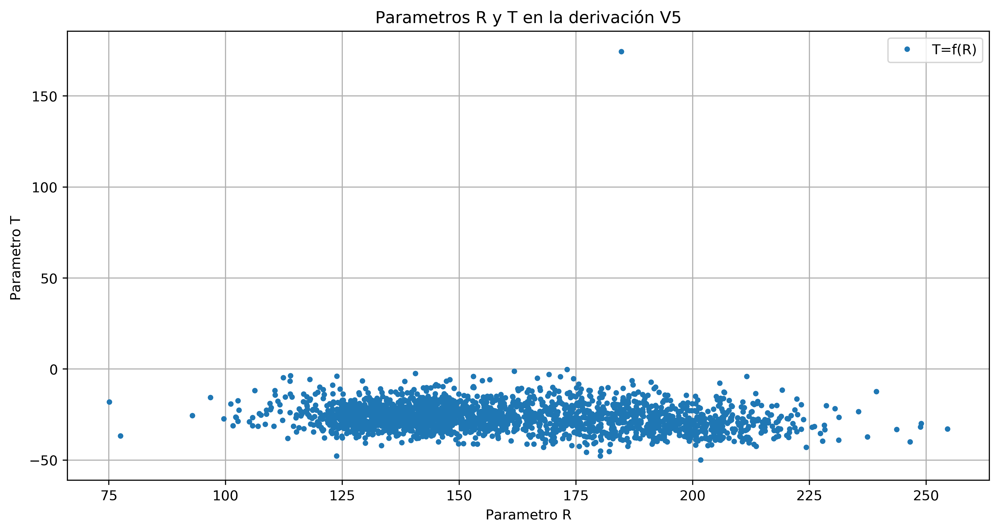

In [27]:
param_R_v5 = []
param_T_v5 = []
#param_W_V5 = []
N_QRS_V5 = len(qrs_v5)-2

for i in range(0,N_QRS_V5-1):
    param_R_v5.append(max(latidos_v5[i]))
    param_T_v5.append(latidos_v5[i][200] )
    
matrix_lat_v5 =[range(2) for i in range(N_QRS_V5)]

for i in range(N_QRS_V5-1):
    matrix_lat_v5[i] = param_R_v5[i],param_T_v5[i]
    
    
plt.figure("parametros RTW V5",figsize=[12,6],dpi=400)
plt.plot(param_R_v5, param_T_v5,'.',label='T=f(R)')
plt.title('Parametros R y T en la derivación V5')
plt.xlabel('Parametro R')
plt.ylabel('Parametro T ')
plt.grid(which='both', axis='both')

axes_RT_V5 = plt.gca()
axes_RT_V5.legend()

---
## Clasificación mediante Wavelet

